In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/plantdisease/data/data.yaml
/kaggle/input/plantdisease/data/valid/labels/Corn___healthy_1137.txt
/kaggle/input/plantdisease/data/valid/labels/Grape___Black_rot_544.txt
/kaggle/input/plantdisease/data/valid/labels/Soybean___healthy_961.txt
/kaggle/input/plantdisease/data/valid/labels/Cherry___Powdery_mildew_586.txt
/kaggle/input/plantdisease/data/valid/labels/Potato___Early_blight_985.txt
/kaggle/input/plantdisease/data/valid/labels/Corn___Common_rust_1159.txt
/kaggle/input/plantdisease/data/valid/labels/Strawberry___healthy_248.txt
/kaggle/input/plantdisease/data/valid/labels/Apple___healthy_1343.txt
/kaggle/input/plantdisease/data/valid/labels/Tomato___Septoria_leaf_spot_1566.txt
/kaggle/input/plantdisease/data/valid/labels/Potato___Late_blight_800.txt
/kaggle/input/plantdisease/data/valid/labels/Tomato___Tomato_mosaic_virus_7.txt
/kaggle/input/plantdisease/data/valid/labels/Grape___Black_rot_463.txt
/kaggle/input/plantdisease/data/valid/labels/Tomato___Bacterial_spot_12

In [2]:
import os
import torch
from torch.utils.data import DataLoader, Dataset
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.transforms import functional as F
from PIL import Image
import matplotlib.pyplot as plt

In [3]:
# Set dataset directory
dataset_path = '/kaggle/input/plantdisease' 

In [4]:
import yaml

# Load data.yaml
data_yaml_path = "/kaggle/input/plantdisease/data/data.yaml"
with open(data_yaml_path, 'r') as file:
    data_yaml = yaml.safe_load(file)

# Extract classes
classes = data_yaml['names']
num_classes = len(classes)

print(f"Classes: {classes}")

Classes: ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Background_without_leaves', 'Blueberry___healthy', 'Cherry___healthy', 'Cherry___Powdery_mildew', 'Corn___Cercospora_leaf_spot Gray_leaf_spot', 'Corn___Common_rust', 'Corn___healthy', 'Corn___Northern_Leaf_Blight', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___healthy', 'Potato___Late_blight', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___healthy', 'Strawberry___Leaf_scorch', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___healthy', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tom

In [5]:
import os
import torch
from torch.utils.data import Dataset
from PIL import Image

class ObjectDetectionDataset(Dataset):
    def __init__(self, images_dir, labels_dir, transforms=None):
        self.images_dir = images_dir
        self.labels_dir = labels_dir
        self.transforms = transforms
        self.image_files = sorted(os.listdir(images_dir))
        self.label_files = sorted(os.listdir(labels_dir))

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        # Load image
        img_path = os.path.join(self.images_dir, self.image_files[idx])
        img = Image.open(img_path).convert("RGB")

        # Load annotations
        label_path = os.path.join(self.labels_dir, self.label_files[idx])
        with open(label_path, 'r') as f:
            boxes = []
            labels = []
            for line in f.readlines():
                cls, x_center, y_center, width, height = map(float, line.strip().split())
                labels.append(int(cls) + 1)  # Class IDs start from 1 in PyTorch
                x_min = (x_center - width / 2) * img.width
                y_min = (y_center - height / 2) * img.height
                x_max = (x_center + width / 2) * img.width
                y_max = (y_center + height / 2) * img.height
                boxes.append([x_min, y_min, x_max, y_max])

        # Convert to tensors
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((len(boxes),), dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": image_id,
            "area": area,
            "iscrowd": iscrowd
        }

        if self.transforms:
            img = self.transforms(img)

        return img, target

In [6]:
from torchvision.transforms import ToTensor

train_images_dir = "/kaggle/input/plantdisease/data/train/images"
train_labels_dir = "/kaggle/input/plantdisease/data/train/labels"
valid_images_dir = "/kaggle/input/plantdisease/data/valid/images"
valid_labels_dir = "/kaggle/input/plantdisease/data/valid/labels"

# Define datasets
train_dataset = ObjectDetectionDataset(train_images_dir, train_labels_dir)
valid_dataset = ObjectDetectionDataset(valid_images_dir, valid_labels_dir)

# Define data loaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
valid_loader = DataLoader(valid_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
valid_loader = DataLoader(valid_dataset, batch_size=2, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

In [7]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# Load pre-trained Faster R-CNN model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

# Update the classifier to match the number of classes
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes + 1)  # +1 for background

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 186MB/s] 


In [8]:
import torch
from torch.optim import SGD
import torchvision.transforms.functional as F
import time
from torch.cuda.amp import autocast, GradScaler

# Set device
torch.backends.cudnn.benchmark = True
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

# Optimizer and LR scheduler
params = [p for p in model.parameters() if p.requires_grad]
optimizer = SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

# Mixed precision scaler
scaler = GradScaler()

# Training loop
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    start = time.time()
    epoch_loss = 0

    for i, (images, targets) in enumerate(train_loader):
        # Convert images and targets to device
        images = [F.to_tensor(img).to(device) if not isinstance(img, torch.Tensor) else img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        optimizer.zero_grad()

        # Mixed precision forward pass
        with autocast():
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())
        
        # Backward pass with scaler
        scaler.scale(losses).backward()
        scaler.step(optimizer)
        scaler.update()

        epoch_loss += losses.item()

        # Print stats every 10 batches
        if i % 10 == 0:
            print(f"Batch {i}/{len(train_loader)}, Loss: {losses.item():.4f}")

    lr_scheduler.step()
    print(f"Epoch {epoch + 1}, Loss: {epoch_loss:.4f}, Time: {time.time() - start:.2f}s")
    torch.save(model.state_dict(), f"faster_rcnn_epoch_{epoch+1}.pth")


/tmp/ipykernel_30/2567643034.py:18: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
/tmp/ipykernel_30/2567643034.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Batch 0/9058, Loss: 4.1848
Batch 10/9058, Loss: 0.3423
Batch 20/9058, Loss: 0.1676
Batch 30/9058, Loss: 0.2566
Batch 40/9058, Loss: 0.2440
Batch 50/9058, Loss: 0.2183
Batch 60/9058, Loss: 0.1896
Batch 70/9058, Loss: 0.1772
Batch 80/9058, Loss: 0.1681
Batch 90/9058, Loss: 0.2043
Batch 100/9058, Loss: 0.1496
Batch 110/9058, Loss: 0.1651
Batch 120/9058, Loss: 0.1539
Batch 130/9058, Loss: 0.0848
Batch 140/9058, Loss: 0.1033
Batch 150/9058, Loss: 0.0995
Batch 160/9058, Loss: 0.0842
Batch 170/9058, Loss: 0.1409
Batch 180/9058, Loss: 0.1124
Batch 190/9058, Loss: 0.1926
Batch 200/9058, Loss: 0.1045
Batch 210/9058, Loss: 0.0968
Batch 220/9058, Loss: 0.1028
Batch 230/9058, Loss: 0.0756
Batch 240/9058, Loss: 0.0792
Batch 250/9058, Loss: 0.1326
Batch 260/9058, Loss: 0.0833
Batch 270/9058, Loss: 0.0902
Batch 280/9058, Loss: 0.0774
Batch 290/9058, Loss: 0.0896
Batch 300/9058, Loss: 0.0816
Batch 310/9058, Loss: 0.1353
Batch 320/9058, Loss: 0.0710
Batch 330/9058, Loss: 0.0547
Batch 340/9058, Loss: 0.0

/tmp/ipykernel_30/1848096741.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


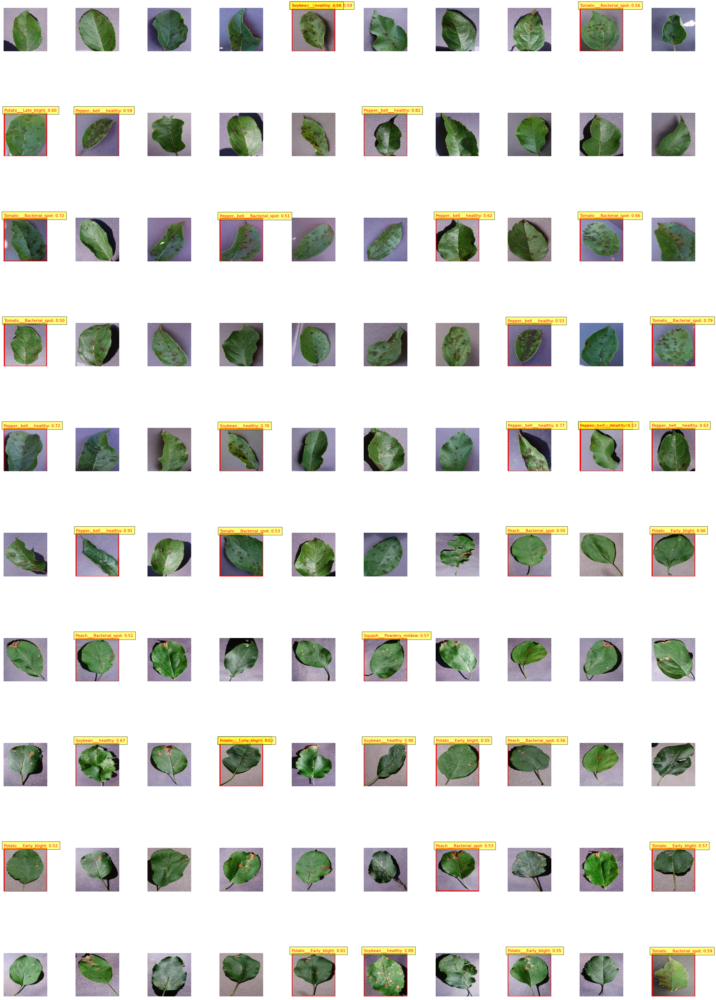

In [25]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision.transforms.functional import to_tensor
import yaml
import torch
from PIL import Image
import os

# Load the trained model
model_path = "faster_rcnn_epoch_10.pth"  # Replace with the path to your saved model
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

# Test dataset directory
test_images_dir = "/kaggle/input/plantdisease/data/test/images"

# Path to the YAML file
yaml_file_path = "/kaggle/input/plantdisease/data/data.yaml"

# Load class names from the YAML file
with open(yaml_file_path, "r") as f:
    data = yaml.safe_load(f)
classes = data["names"]  # Assuming the 'names' key contains class names

# Visualize predictions in a dynamically sized grid
def visualize_predictions_grid(image_paths, predictions_list, classes, threshold=0.5):
    num_images = len(image_paths)
    grid_cols = 10  # Number of columns in the grid (you can adjust this)
    grid_rows = (num_images + grid_cols - 1) // grid_cols  # Calculate required rows

    fig, axes = plt.subplots(grid_rows, grid_cols, figsize=(20, grid_rows * 3))
    axes = axes.ravel()

    for idx, (image_path, predictions) in enumerate(zip(image_paths, predictions_list)):
        if idx >= len(axes):
            break

        # Load the image
        img = Image.open(image_path).convert("RGB")
        axes[idx].imshow(img)
        ax = axes[idx]

        # Draw predictions
        for box, label, score in zip(
            predictions["boxes"], predictions["labels"], predictions["scores"]
        ):
            if score >= threshold:
                x_min, y_min, x_max, y_max = box
                width, height = x_max - x_min, y_max - y_min

                # Draw the bounding box
                rect = patches.Rectangle(
                    (x_min, y_min), width, height, linewidth=2, edgecolor="red", facecolor="none"
                )
                ax.add_patch(rect)

                # Add label and score
                ax.text(
                    x_min,
                    y_min - 10,
                    f"{classes[label - 1]}: {score:.2f}",
                    color="red",
                    fontsize=8,
                    bbox=dict(facecolor="yellow", alpha=0.5),
                )

        ax.axis("off")

    # Hide unused subplots
    for idx in range(len(image_paths), len(axes)):
        axes[idx].axis("off")

    plt.tight_layout()
    plt.show()


# Update the number of images to process
max_images_to_process = 100  # Now set to 100
test_images = sorted(os.listdir(test_images_dir))[:max_images_to_process]
image_paths = [os.path.join(test_images_dir, img) for img in test_images]

# Get predictions for the test images
predictions_list = []
for image_path in image_paths:
    # Preprocess the image
    img = Image.open(image_path).convert("RGB")
    img_tensor = to_tensor(img).unsqueeze(0).to(device)

    # Get predictions
    with torch.no_grad():
        outputs = model(img_tensor)

    predictions = {
        "boxes": outputs[0]["boxes"].cpu().numpy(),
        "labels": outputs[0]["labels"].cpu().numpy(),
        "scores": outputs[0]["scores"].cpu().numpy(),
    }
    predictions_list.append(predictions)

# Visualize predictions in a grid
visualize_predictions_grid(image_paths, predictions_list, classes, threshold=0.5)

In [31]:
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score
import torch

test_labels_dir = '/kaggle/input/plantdisease/data/test/labels'

# Define a function to calculate IoU
def calculate_iou(box1, box2):
    """
    Calculates Intersection over Union (IoU) between two bounding boxes.
    box1 and box2 should be in the format [x_min, y_min, x_max, y_max].
    """
    x_min1, y_min1, x_max1, y_max1 = box1
    x_min2, y_min2, x_max2, y_max2 = box2

    inter_x_min = max(x_min1, x_min2)
    inter_y_min = max(y_min1, y_min2)
    inter_x_max = min(x_max1, x_max2)
    inter_y_max = min(y_max1, y_max2)

    # Compute the area of intersection
    inter_area = max(0, inter_x_max - inter_x_min) * max(0, inter_y_max - inter_y_min)

    # Compute the area of both boxes
    box1_area = (x_max1 - x_min1) * (y_max1 - y_min1)
    box2_area = (x_max2 - x_min2) * (y_max2 - y_min2)

    # Compute the IoU
    iou = inter_area / (box1_area + box2_area - inter_area + 1e-6)
    return iou

# Load ground truth labels and predictions
threshold = 0.2  # Confidence threshold
iou_threshold = 0.4  # IoU threshold for a valid detection

all_true_labels = []
all_pred_labels = []
all_pred_scores = []

for image_name in test_images:
    image_path = os.path.join(test_images_dir, image_name)
    label_path = os.path.join(test_labels_dir, image_name.replace(".jpg", ".txt"))

    # Preprocess the image
    img = Image.open(image_path).convert("RGB")
    img_tensor = to_tensor(img).unsqueeze(0).to(device)

    # Get predictions
    with torch.no_grad():
        outputs = model(img_tensor)

    predictions = {
        "boxes": outputs[0]["boxes"].cpu().numpy(),
        "labels": outputs[0]["labels"].cpu().numpy(),
        "scores": outputs[0]["scores"].cpu().numpy(),
    }

    # Load ground truth
    ground_truth = {"boxes": [], "labels": []}
    with open(label_path, "r") as f:
        for line in f.readlines():
            cls, x_center, y_center, width, height = map(float, line.strip().split())
            x_min = (x_center - width / 2) * img.width
            y_min = (y_center - height / 2) * img.height
            x_max = (x_center + width / 2) * img.width
            y_max = (y_center + height / 2) * img.height
            ground_truth["boxes"].append([x_min, y_min, x_max, y_max])
            ground_truth["labels"].append(int(cls) + 1)

    # Match predictions with ground truth using IoU
    for gt_box, gt_label in zip(ground_truth["boxes"], ground_truth["labels"]):
        matched = False
        for pred_box, pred_label, pred_score in zip(
            predictions["boxes"], predictions["labels"], predictions["scores"]
        ):
            if pred_score >= threshold and calculate_iou(gt_box, pred_box) >= iou_threshold:
                all_true_labels.append(gt_label)
                all_pred_labels.append(pred_label)
                all_pred_scores.append(pred_score)
                matched = True
                break
        if not matched:
            all_true_labels.append(gt_label)
            all_pred_labels.append(0)  # No prediction made for this ground truth

# Calculate metrics
precision = precision_score(all_true_labels, all_pred_labels, average="weighted", zero_division=1)
recall = recall_score(all_true_labels, all_pred_labels, average="weighted", zero_division=1)
f1 = f1_score(all_true_labels, all_pred_labels, average="weighted", zero_division=1)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")

Precision: 1.0000
Recall: 0.0000
F1-Score: 0.0000


In [32]:
from sklearn.metrics import classification_report
import numpy as np

# Ensure you have all true and predicted labels collected properly
# all_true_labels and all_pred_labels should be lists or numpy arrays

# Generate unique labels for evaluation
unique_true_labels = np.unique(all_true_labels)
unique_pred_labels = np.unique(all_pred_labels)

# Generate classification report
print(classification_report(all_true_labels, all_pred_labels, 
                            target_names=[classes[i] for i in unique_true_labels],
                            labels=unique_true_labels))


                          precision    recall  f1-score   support

       Apple___Black_rot       0.00      0.00      0.00      56.0
Apple___Cedar_apple_rust       0.00      0.00      0.00      43.0
         Apple___healthy       0.00      0.00      0.00       1.0

               micro avg       0.00      0.00      0.00     100.0
               macro avg       0.00      0.00      0.00     100.0
            weighted avg       0.00      0.00      0.00     100.0



/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.

In [39]:
unique_true_classes = set(all_true_labels)
unique_pred_classes = set(all_pred_labels)

print("Unique classes in ground truth labels:", unique_true_classes)
print("Unique classes in predicted labels:", unique_pred_classes)
print("Number of unique classes in ground truth:", len(unique_true_classes))
print("Number of unique classes in predicted:", len(unique_pred_classes))

Unique classes in ground truth labels: {1, 2, 3}
Unique classes in predicted labels: {33, 36, 18, 19, 20, 21, 22, 24, 26, 27, 30, 31}
Number of unique classes in ground truth: 3
Number of unique classes in predicted: 12
